# Keras Regression

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
# %matplotlib notebook
plt.rcParams["figure.figsize"] = (12,6)
# plt.rcParams['figure.dpi'] = 100
sns.set_style("whitegrid")
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [2]:
#!pip install folium 

In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

In [4]:
#df = pd.read_csv("drive/MyDrive/Colab_Files/data/kc_house_data.csv")

In [5]:
#from matplotlib import style
#style.use('dark_background')

In [6]:
df = pd.read_csv("kc_house_data.csv")

## Exploratory Data Analysis and Visualization

In [7]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,...,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,...,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,...,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,...,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,...,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [9]:
df.isnull().sum().any()

False

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


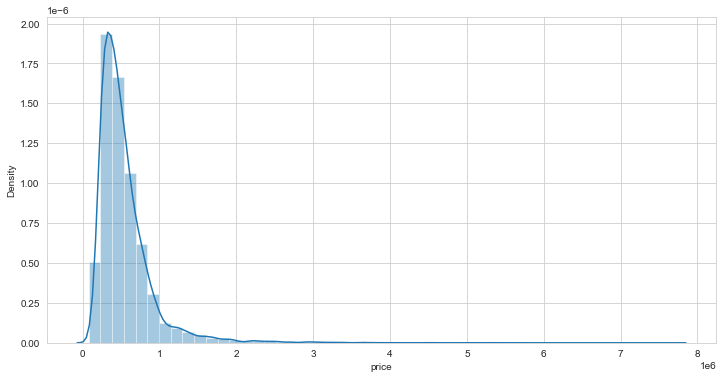

In [11]:
sns.distplot(df['price']);

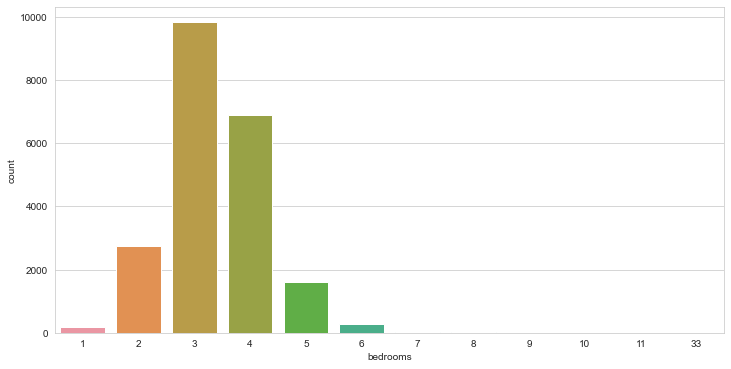

In [12]:
sns.countplot(df['bedrooms']);

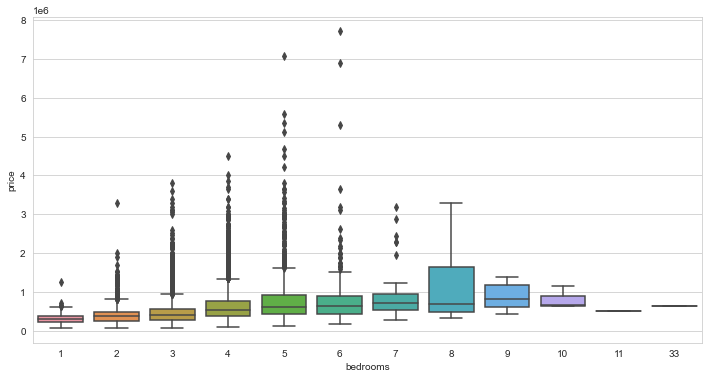

In [13]:
sns.boxplot(x = 'bedrooms', y = 'price', data = df);

In [14]:
df[df["bedrooms"] > 10]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,1773100755,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,...,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,2402100895,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,...,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [15]:
df.corr()["price"].sort_values(ascending = False)

price            1.000
sqft_living      0.702
grade            0.668
sqft_above       0.605
sqft_living15    0.585
bathrooms        0.526
view             0.397
sqft_basement    0.324
bedrooms         0.309
lat              0.307
waterfront       0.266
floors           0.257
yr_renovated     0.126
sqft_lot         0.090
sqft_lot15       0.083
yr_built         0.054
condition        0.036
long             0.022
id              -0.017
zipcode         -0.053
Name: price, dtype: float64

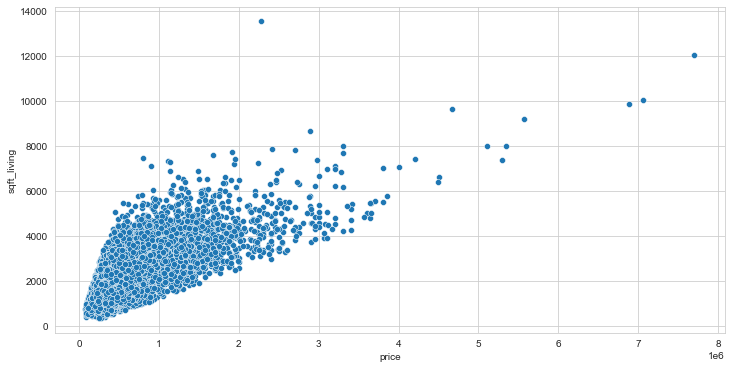

In [16]:
sns.scatterplot(x = 'price',y = 'sqft_living', data = df);

### Geographical Properties

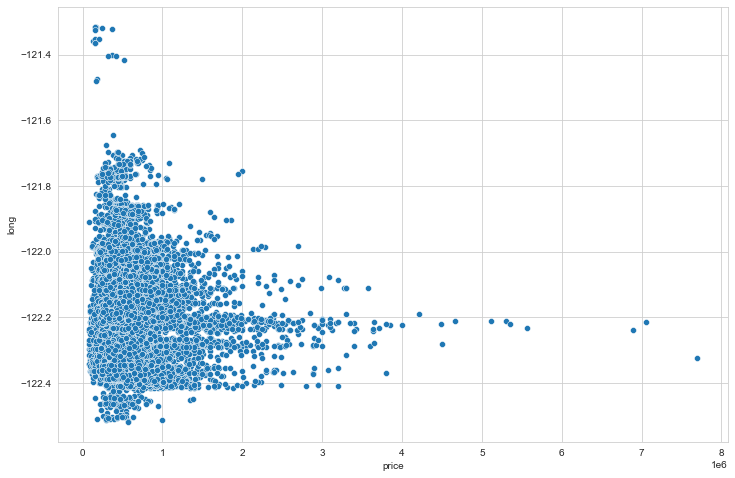

In [17]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'price', y = 'long', data = df);

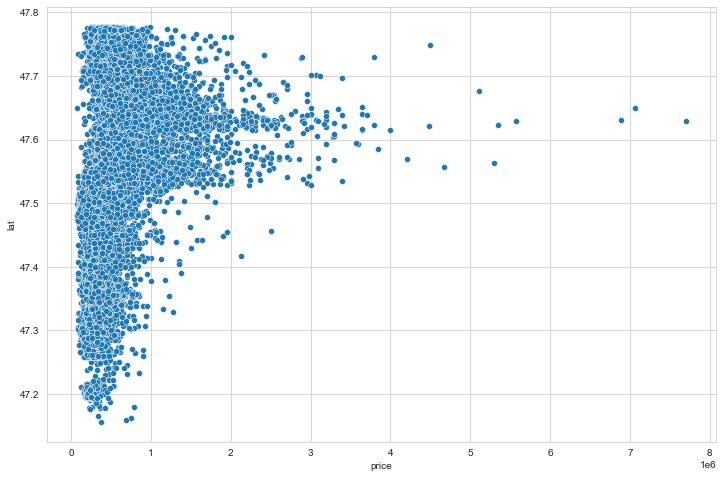

In [18]:
plt.figure(figsize  = (12, 8))
sns.scatterplot(x = 'price', y = 'lat', data = df);

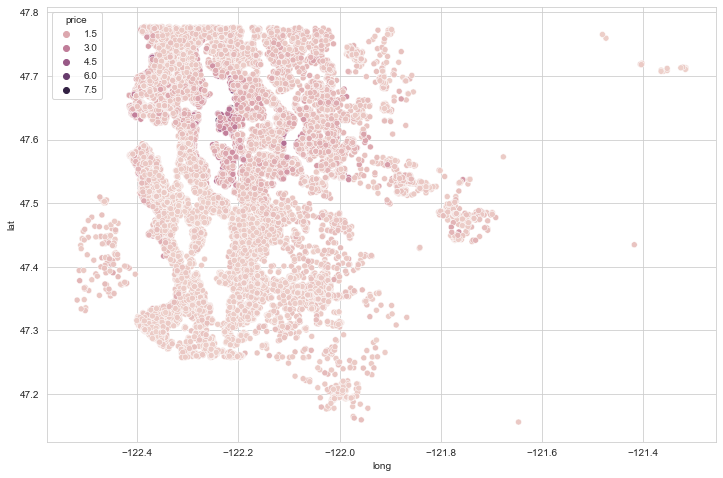

In [19]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = df, hue = 'price');

In [20]:
import folium
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

In [21]:
map_kc = folium.Map(location=[47.511,  -122.257], zoom_start = 10)
for lat, lng in zip(df['lat'], df['long']):
    folium.CircleMarker(
        [lat, lng],
        radius = 1,
        color = 'blue',
        fill = False ,
        fill_color ='#3186CC',
        fill_opacity = 0.3).add_to(map_kc)
map_kc

In [22]:
df.sort_values('price', ascending = False).head(20)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,6762700020,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,...,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,9808700762,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,...,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9208900037,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,...,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,2470100110,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,...,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,8907500070,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,...,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,7558700030,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,...,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,1247600105,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,...,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,1924059029,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,...,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,7738500731,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,...,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,3835500195,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,...,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


In [23]:
len(df) * (0.01)

215.97

In [24]:
df.sort_values('price', ascending = False).head(216)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,6762700020,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,...,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,9808700762,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,...,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9208900037,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,...,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,2470100110,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,...,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,8907500070,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,...,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19513,1651500040,8/1/2014,1980000.000,4,4.000,4360,12081,2.000,0,0,...,10,4360,0,2007,0,98004,47.638,-122.219,2180,10800
7408,5017000470,7/10/2014,1980000.000,6,4.500,4800,9097,2.000,0,0,...,10,3580,1220,2007,0,98112,47.626,-122.291,2180,6037
16511,2025059026,2/25/2015,1980000.000,4,3.500,4500,44384,1.000,0,0,...,12,3340,1160,1990,0,98004,47.632,-122.192,2540,26287
3278,8964800025,2/26/2015,1970000.000,5,3.750,3940,13738,1.500,0,3,...,9,3940,0,1951,0,98004,47.620,-122.212,2370,13320


In [25]:
non_top_1_perc = df.sort_values('price', ascending = False).iloc[216:]
# datamızdaki price sütununu grafik üzerinde renklendirmek için datamızı price sütununa göre küçükten büyüğe doğru sıraladık.

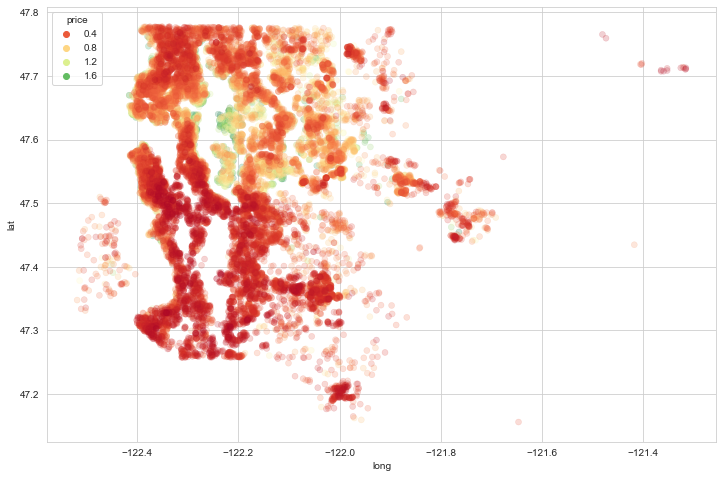

In [26]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = non_top_1_perc, hue = 'price',
                palette = 'RdYlGn', edgecolor = None, alpha = 0.2);
# Sıralanan price değerlerini scatterplot ile çizdiriyoruz.

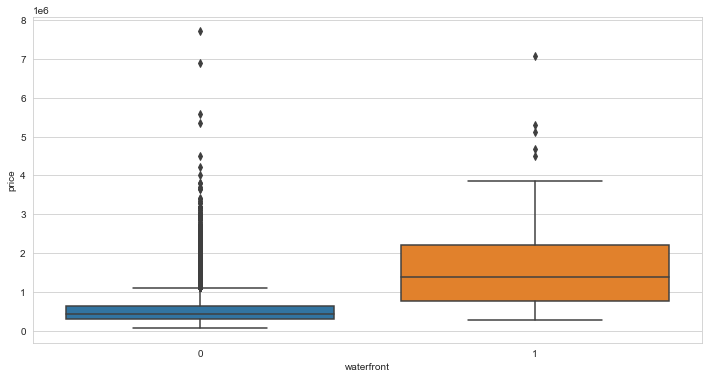

In [27]:
sns.boxplot(x = 'waterfront', y = 'price', data = df);

### Feature Engineering

In [28]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,...,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,...,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,...,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,...,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,...,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


In [29]:
df = df.drop('id', axis = 1)

#### bedrooms

In [30]:
df = df[df["bedrooms"] != 33]

Most likely the data was entered incorrectly.

In [31]:
df.shape

(21596, 20)

#### price

In [32]:
#df = df[df["price"] < 1000000]

In [33]:
#df.shape

#### date

In [34]:
df['date'] = pd.to_datetime(df['date'])

In [35]:
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [36]:
df['year'] = df['date'].apply(lambda date : date.year)

In [37]:
df['month'] = df['date'].apply(lambda date : date.month)

In [38]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,...,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,...,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,...,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,...,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,...,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


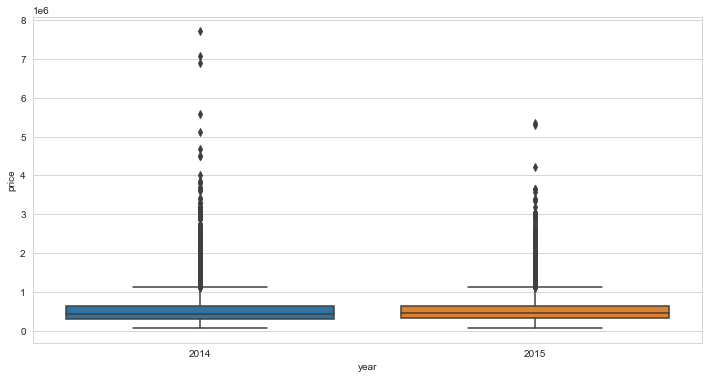

In [39]:
sns.boxplot(x = 'year', y = 'price', data = df);

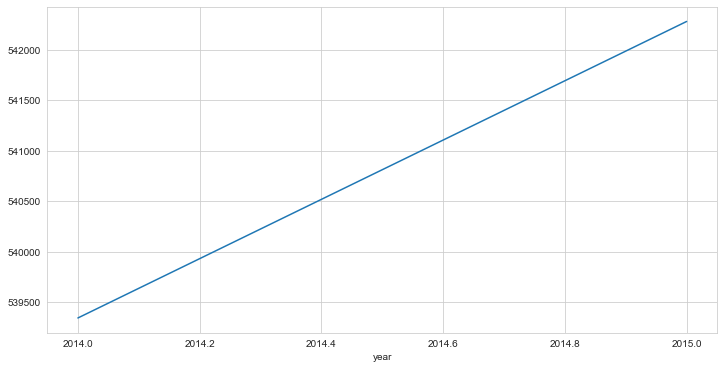

In [40]:
df.groupby('year')['price'].mean().plot();

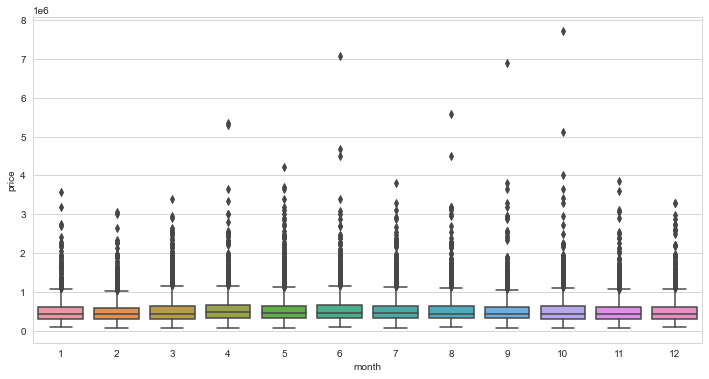

In [41]:
sns.boxplot(x = 'month', y = 'price', data = df);

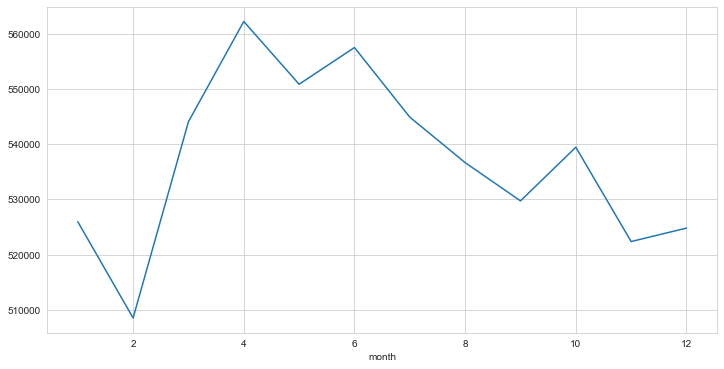

In [42]:
df.groupby('month')['price'].mean().plot();

In [43]:
df = df.drop('date', axis = 1)

In [44]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,...,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,...,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,...,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,...,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,...,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


#### zipcode

In [45]:
df['zipcode'].value_counts()

98103    601
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

we can categorize the zipcodes as high, low, medium or north, south, west, east, middle by house prices. But it can be made manually and taken many time and we need domain knowladge to do that. So we will drop this column.

In [46]:
df = df.drop('zipcode', axis = 1)

#### yr_renovated

In [47]:
df['yr_renovated'].value_counts()

0       20682
2014       91
2013       37
2003       36
2007       35
        ...  
1948        1
1954        1
1951        1
1944        1
1959        1
Name: yr_renovated, Length: 70, dtype: int64

could make sense due to scaling, higher should correlate to more value

In [48]:
# df["yr_renovated"].replace(0, np.nan, inplace = True)
# df["yr_renovated"].fillna(df["yr_built"], inplace = True)
# df["new_age"] = 2021 - df["yr_renovated"]
# df.drop(["yr_renovated", "yr_built"], axis = 1, inplace = True)

In [49]:
# df["yr_renovated"].replace(0, np.nan, inplace = True)
# df["yr_renovated"].fillna(df["yr_built"], inplace = True)
# df.drop("yr_built", axis = 1, inplace = True)

#### sqft_basement

In [50]:
df['sqft_basement'].value_counts()

0       13110
600       221
700       218
500       214
800       206
        ...  
65          1
1248        1
172         1
1920        1
1135        1
Name: sqft_basement, Length: 306, dtype: int64

could make sense due to scaling, higher should correlate to more value

#### latest data

In [51]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,year,month
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,2014,10
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,47.721,-122.319,1690,7639,2014,12
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,47.738,-122.233,2720,8062,2015,2
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,47.521,-122.393,1360,5000,2014,12
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,47.617,-122.045,1800,7503,2015,2


### Preprocessing of Data
- Train | Test Split, Scalling

In [52]:
from sklearn.model_selection import train_test_split

In [53]:
X = df.drop('price', axis = 1)
y = df['price']

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [55]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

# If there are too many outliers in the data, robust scaler should be used, otherwise minmax can be used.

In [56]:
scaler = MinMaxScaler()

In [57]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### Modelling & Model Performance

In [58]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.optimizers import Adam

In [59]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score

In [60]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [61]:
X_train.shape

(15117, 19)

In [62]:
model = Sequential()

model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

model.compile(optimizer = 'adam', loss = 'mse')

In [63]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 700)

Epoch 1/700
119/119 [==============================] - 1s 4ms/step - loss: 430001225728.0000 - val_loss: 419489054720.0000
Epoch 2/700
119/119 [==============================] - 0s 3ms/step - loss: 429107478528.0000 - val_loss: 416468336640.0000
Epoch 3/700
119/119 [==============================] - 0s 2ms/step - loss: 417229864960.0000 - val_loss: 389258510336.0000
Epoch 4/700
119/119 [==============================] - 0s 3ms/step - loss: 356788043776.0000 - val_loss: 289314766848.0000
Epoch 5/700
119/119 [==============================] - 0s 3ms/step - loss: 221061152768.0000 - val_loss: 143555985408.0000
Epoch 6/700
119/119 [==============================] - 0s 3ms/step - loss: 114762448896.0000 - val_loss: 98603253760.0000
Epoch 7/700
119/119 [==============================] - 0s 3ms/step - loss: 98438774784.0000 - val_loss: 96555499520.0000
Epoch 8/700
119/119 [==============================] - 0s 2ms/step - loss: 96721018880.0000 - val_loss: 95048826880.0000
Epoch 9/700
119/119 [

119/119 [==============================] - 0s 2ms/step - loss: 38025908224.0000 - val_loss: 39211933696.0000
Epoch 69/700
119/119 [==============================] - 0s 2ms/step - loss: 37783580672.0000 - val_loss: 38953213952.0000
Epoch 70/700
119/119 [==============================] - 0s 2ms/step - loss: 37641469952.0000 - val_loss: 38768594944.0000
Epoch 71/700
119/119 [==============================] - 0s 3ms/step - loss: 37403373568.0000 - val_loss: 38548246528.0000
Epoch 72/700
119/119 [==============================] - 0s 2ms/step - loss: 37185540096.0000 - val_loss: 38381191168.0000
Epoch 73/700
119/119 [==============================] - 0s 3ms/step - loss: 37024169984.0000 - val_loss: 38266593280.0000
Epoch 74/700
119/119 [==============================] - 0s 2ms/step - loss: 36899766272.0000 - val_loss: 38045822976.0000
Epoch 75/700
119/119 [==============================] - 0s 3ms/step - loss: 36734943232.0000 - val_loss: 37930393600.0000
Epoch 76/700
119/119 [===============

Epoch 135/700
119/119 [==============================] - 0s 3ms/step - loss: 32691486720.0000 - val_loss: 33824692224.0000
Epoch 136/700
119/119 [==============================] - 0s 3ms/step - loss: 32716271616.0000 - val_loss: 33752141824.0000
Epoch 137/700
119/119 [==============================] - 1s 4ms/step - loss: 32661116928.0000 - val_loss: 33709363200.0000
Epoch 138/700
119/119 [==============================] - 0s 2ms/step - loss: 32576280576.0000 - val_loss: 33682311168.0000
Epoch 139/700
119/119 [==============================] - 0s 3ms/step - loss: 32584181760.0000 - val_loss: 33679157248.0000
Epoch 140/700
119/119 [==============================] - 0s 2ms/step - loss: 32570953728.0000 - val_loss: 33581887488.0000
Epoch 141/700
119/119 [==============================] - 0s 3ms/step - loss: 32488364032.0000 - val_loss: 33558171648.0000
Epoch 142/700
119/119 [==============================] - 0s 2ms/step - loss: 32464482304.0000 - val_loss: 33534167040.0000
Epoch 143/700
11

119/119 [==============================] - 0s 2ms/step - loss: 30955620352.0000 - val_loss: 31974854656.0000
Epoch 202/700
119/119 [==============================] - 0s 3ms/step - loss: 30896472064.0000 - val_loss: 31943909376.0000
Epoch 203/700
119/119 [==============================] - 0s 2ms/step - loss: 30870550528.0000 - val_loss: 31927568384.0000
Epoch 204/700
119/119 [==============================] - 0s 2ms/step - loss: 30866851840.0000 - val_loss: 31915546624.0000
Epoch 205/700
119/119 [==============================] - 0s 3ms/step - loss: 30819334144.0000 - val_loss: 31897022464.0000
Epoch 206/700
119/119 [==============================] - 0s 2ms/step - loss: 30863652864.0000 - val_loss: 31932270592.0000
Epoch 207/700
119/119 [==============================] - 0s 3ms/step - loss: 30829635584.0000 - val_loss: 31869710336.0000
Epoch 208/700
119/119 [==============================] - 0s 2ms/step - loss: 30785712128.0000 - val_loss: 31853824000.0000
Epoch 209/700
119/119 [=======

119/119 [==============================] - 0s 2ms/step - loss: 29903558656.0000 - val_loss: 31144134656.0000
Epoch 268/700
119/119 [==============================] - 0s 2ms/step - loss: 29905416192.0000 - val_loss: 31245582336.0000
Epoch 269/700
119/119 [==============================] - 0s 2ms/step - loss: 29907709952.0000 - val_loss: 31119058944.0000
Epoch 270/700
119/119 [==============================] - 0s 2ms/step - loss: 29894420480.0000 - val_loss: 31200950272.0000
Epoch 271/700
119/119 [==============================] - 0s 2ms/step - loss: 29868865536.0000 - val_loss: 31092047872.0000
Epoch 272/700
119/119 [==============================] - 0s 2ms/step - loss: 29856907264.0000 - val_loss: 31099662336.0000
Epoch 273/700
119/119 [==============================] - 0s 3ms/step - loss: 29871118336.0000 - val_loss: 31087048704.0000
Epoch 274/700
119/119 [==============================] - 0s 2ms/step - loss: 29855862784.0000 - val_loss: 31065178112.0000
Epoch 275/700
119/119 [=======

119/119 [==============================] - 0s 3ms/step - loss: 29157435392.0000 - val_loss: 30432858112.0000
Epoch 334/700
119/119 [==============================] - 0s 2ms/step - loss: 29150429184.0000 - val_loss: 30376507392.0000
Epoch 335/700
119/119 [==============================] - 0s 3ms/step - loss: 29111662592.0000 - val_loss: 30440538112.0000
Epoch 336/700
119/119 [==============================] - 0s 2ms/step - loss: 29092304896.0000 - val_loss: 30349590528.0000
Epoch 337/700
119/119 [==============================] - 0s 2ms/step - loss: 29087082496.0000 - val_loss: 30353051648.0000
Epoch 338/700
119/119 [==============================] - 0s 3ms/step - loss: 29077704704.0000 - val_loss: 30355798016.0000
Epoch 339/700
119/119 [==============================] - 0s 2ms/step - loss: 29097414656.0000 - val_loss: 30354712576.0000
Epoch 340/700
119/119 [==============================] - 0s 2ms/step - loss: 29080690688.0000 - val_loss: 30290081792.0000
Epoch 341/700
119/119 [=======

119/119 [==============================] - 0s 4ms/step - loss: 28325810176.0000 - val_loss: 29595246592.0000
Epoch 400/700
119/119 [==============================] - 0s 4ms/step - loss: 28350472192.0000 - val_loss: 29564248064.0000
Epoch 401/700
119/119 [==============================] - 0s 4ms/step - loss: 28309962752.0000 - val_loss: 29565990912.0000
Epoch 402/700
119/119 [==============================] - 0s 3ms/step - loss: 28293089280.0000 - val_loss: 29558214656.0000
Epoch 403/700
119/119 [==============================] - 0s 3ms/step - loss: 28285571072.0000 - val_loss: 29551951872.0000
Epoch 404/700
119/119 [==============================] - 0s 3ms/step - loss: 28282804224.0000 - val_loss: 29586876416.0000
Epoch 405/700
119/119 [==============================] - 0s 2ms/step - loss: 28310847488.0000 - val_loss: 29515503616.0000
Epoch 406/700
119/119 [==============================] - 0s 3ms/step - loss: 28293711872.0000 - val_loss: 29552531456.0000
Epoch 407/700
119/119 [=======

119/119 [==============================] - 0s 3ms/step - loss: 27692283904.0000 - val_loss: 28883187712.0000
Epoch 466/700
119/119 [==============================] - 0s 2ms/step - loss: 27659900928.0000 - val_loss: 29224873984.0000
Epoch 467/700
119/119 [==============================] - 0s 2ms/step - loss: 27781806080.0000 - val_loss: 28941678592.0000
Epoch 468/700
119/119 [==============================] - 0s 2ms/step - loss: 27683713024.0000 - val_loss: 28842211328.0000
Epoch 469/700
119/119 [==============================] - 0s 3ms/step - loss: 27700744192.0000 - val_loss: 28853387264.0000
Epoch 470/700
119/119 [==============================] - 0s 2ms/step - loss: 27650682880.0000 - val_loss: 28849172480.0000
Epoch 471/700
119/119 [==============================] - 0s 3ms/step - loss: 27621265408.0000 - val_loss: 28894115840.0000
Epoch 472/700
119/119 [==============================] - 0s 3ms/step - loss: 27617226752.0000 - val_loss: 28837107712.0000
Epoch 473/700
119/119 [=======

119/119 [==============================] - 0s 3ms/step - loss: 27213375488.0000 - val_loss: 28332959744.0000
Epoch 532/700
119/119 [==============================] - 0s 3ms/step - loss: 27181930496.0000 - val_loss: 28349274112.0000
Epoch 533/700
119/119 [==============================] - 0s 2ms/step - loss: 27162511360.0000 - val_loss: 28430028800.0000
Epoch 534/700
119/119 [==============================] - 0s 2ms/step - loss: 27202232320.0000 - val_loss: 28341145600.0000
Epoch 535/700
119/119 [==============================] - 0s 3ms/step - loss: 27151392768.0000 - val_loss: 28330414080.0000
Epoch 536/700
119/119 [==============================] - 0s 2ms/step - loss: 27151316992.0000 - val_loss: 28356171776.0000
Epoch 537/700
119/119 [==============================] - 0s 2ms/step - loss: 27135969280.0000 - val_loss: 28331958272.0000
Epoch 538/700
119/119 [==============================] - 0s 2ms/step - loss: 27143479296.0000 - val_loss: 28315514880.0000
Epoch 539/700
119/119 [=======

119/119 [==============================] - 0s 3ms/step - loss: 26668779520.0000 - val_loss: 27971710976.0000
Epoch 598/700
119/119 [==============================] - 0s 2ms/step - loss: 26647842816.0000 - val_loss: 27933870080.0000
Epoch 599/700
119/119 [==============================] - 0s 2ms/step - loss: 26632136704.0000 - val_loss: 27960913920.0000
Epoch 600/700
119/119 [==============================] - 0s 2ms/step - loss: 26659006464.0000 - val_loss: 27923644416.0000
Epoch 601/700
119/119 [==============================] - 0s 2ms/step - loss: 26652536832.0000 - val_loss: 27897872384.0000
Epoch 602/700
119/119 [==============================] - 0s 2ms/step - loss: 26627614720.0000 - val_loss: 27910522880.0000
Epoch 603/700
119/119 [==============================] - 0s 2ms/step - loss: 26613833728.0000 - val_loss: 27907739648.0000
Epoch 604/700
119/119 [==============================] - 0s 2ms/step - loss: 26593277952.0000 - val_loss: 28035080192.0000
Epoch 605/700
119/119 [=======

119/119 [==============================] - 0s 2ms/step - loss: 26161190912.0000 - val_loss: 27881801728.0000
Epoch 664/700
119/119 [==============================] - 0s 2ms/step - loss: 26228649984.0000 - val_loss: 27795165184.0000
Epoch 665/700
119/119 [==============================] - 0s 2ms/step - loss: 26201382912.0000 - val_loss: 27782563840.0000
Epoch 666/700
119/119 [==============================] - 0s 2ms/step - loss: 26184359936.0000 - val_loss: 27841490944.0000
Epoch 667/700
119/119 [==============================] - 0s 2ms/step - loss: 26163087360.0000 - val_loss: 27776370688.0000
Epoch 668/700
119/119 [==============================] - 0s 4ms/step - loss: 26165438464.0000 - val_loss: 27874379776.0000
Epoch 669/700
119/119 [==============================] - 0s 2ms/step - loss: 26165665792.0000 - val_loss: 27791753216.0000
Epoch 670/700
119/119 [==============================] - 0s 2ms/step - loss: 26142554112.0000 - val_loss: 27798112256.0000
Epoch 671/700
119/119 [=======

In [64]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 19)                380       
_________________________________________________________________
dense_1 (Dense)              (None, 19)                380       
_________________________________________________________________
dense_2 (Dense)              (None, 19)                380       
_________________________________________________________________
dense_3 (Dense)              (None, 19)                380       
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 20        
Total params: 1,540
Trainable params: 1,540
Non-trainable params: 0
_________________________________________________________________


In [65]:
pd.DataFrame(model.history.history)

,loss,val_loss
0,430001225728.000,419489054720.000
1,429107478528.000,416468336640.000
2,417229864960.000,389258510336.000
3,356788043776.000,289314766848.000
4,221061152768.000,143555985408.000
...,...,...
695,26001025024.000,27867138048.000
696,26056566784.000,27800238080.000
697,25976231936.000,27801573376.000
698,25988691968.000,27843192832.000


<AxesSubplot:>

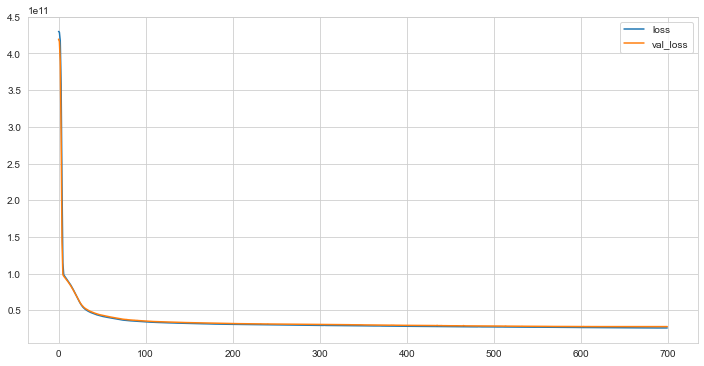

In [66]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [67]:
y_pred = model.predict(X_test)

In [68]:
eval_metric(y_test, y_pred)

r2_score: 0.7897154958376713 
mae: 103541.54014954565 
mse: 27858819380.611153 
rmse: 166909.61440435704


### EarlyStopping

In [69]:
from tensorflow.keras.callbacks import EarlyStopping

In [101]:
model = Sequential()

model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

model.compile(optimizer = 'adam', loss = 'mse')

In [102]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 15)
# EarlyStopping modelimizi eğitirken (monitor) parametresindeki değeri izleyerek (burada "val_loss" değerini izliyoruz.) (mode) parametresinde belirtilen kosulu (koşullar "min", "max", "auto") (patience) patience parametresindeki sayı kadar takip ediyor ve artık modelde herhangi bir düzelme olmuyorsa eğitimi durduruyor.
# Kısaca EarlyStopping yazılan parametrelere göre model.fit deki epoch sayısı kadar eğitim yapmak yerine modelde iyileşmede artık ilerleme olmuyorsa eğitimi erkenden durduruyor. 
# Not: patience parametresini daha küçük yazmak modelde tam öğrenme gerçekleşmeden sonlandırılmaya neden olur. O yüzden 15-25 ideal bir aralıktır.

In [103]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 1000, callbacks = [early_stop])
# callbacks early_stop taki parametreleri çalıştırıyor.
# Not: Eğer datamız küçük ise datamızı batch_size bölmemize gerek yoktur. Çünkü batch_size memory kullanımı düşürmek içindir.

Epoch 1/1000
119/119 [==============================] - 1s 4ms/step - loss: 429996015616.0000 - val_loss: 419455762432.0000
Epoch 2/1000
119/119 [==============================] - 0s 3ms/step - loss: 428331401216.0000 - val_loss: 413482057728.0000
Epoch 3/1000
119/119 [==============================] - 0s 4ms/step - loss: 402986696704.0000 - val_loss: 355248275456.0000
Epoch 4/1000
119/119 [==============================] - 0s 4ms/step - loss: 286579392512.0000 - val_loss: 187266711552.0000
Epoch 5/1000
119/119 [==============================] - 1s 5ms/step - loss: 131776552960.0000 - val_loss: 99829366784.0000
Epoch 6/1000
119/119 [==============================] - 0s 4ms/step - loss: 99116032000.0000 - val_loss: 96959315968.0000
Epoch 7/1000
119/119 [==============================] - 0s 4ms/step - loss: 97010204672.0000 - val_loss: 95237464064.0000
Epoch 8/1000
119/119 [==============================] - 0s 4ms/step - loss: 95083905024.0000 - val_loss: 93386899456.0000
Epoch 9/1000
11

119/119 [==============================] - 0s 2ms/step - loss: 35927687168.0000 - val_loss: 36891451392.0000
Epoch 68/1000
119/119 [==============================] - 0s 3ms/step - loss: 35757821952.0000 - val_loss: 36766531584.0000
Epoch 69/1000
119/119 [==============================] - 0s 3ms/step - loss: 35603050496.0000 - val_loss: 36748824576.0000
Epoch 70/1000
119/119 [==============================] - 0s 2ms/step - loss: 35498336256.0000 - val_loss: 36482314240.0000
Epoch 71/1000
119/119 [==============================] - 0s 2ms/step - loss: 35343962112.0000 - val_loss: 36354711552.0000
Epoch 72/1000
119/119 [==============================] - 0s 3ms/step - loss: 35215941632.0000 - val_loss: 36182310912.0000
Epoch 73/1000
119/119 [==============================] - 0s 2ms/step - loss: 35064229888.0000 - val_loss: 36025004032.0000
Epoch 74/1000
119/119 [==============================] - 0s 2ms/step - loss: 34970628096.0000 - val_loss: 35897901056.0000
Epoch 75/1000
119/119 [=======

Epoch 133/1000
119/119 [==============================] - 0s 2ms/step - loss: 31674456064.0000 - val_loss: 32618500096.0000
Epoch 134/1000
119/119 [==============================] - 0s 2ms/step - loss: 31638503424.0000 - val_loss: 32590714880.0000
Epoch 135/1000
119/119 [==============================] - 0s 3ms/step - loss: 31623135232.0000 - val_loss: 32526065664.0000
Epoch 136/1000
119/119 [==============================] - 0s 2ms/step - loss: 31568400384.0000 - val_loss: 32486774784.0000
Epoch 137/1000
119/119 [==============================] - 0s 3ms/step - loss: 31545995264.0000 - val_loss: 32546916352.0000
Epoch 138/1000
119/119 [==============================] - 0s 3ms/step - loss: 31530967040.0000 - val_loss: 32432730112.0000
Epoch 139/1000
119/119 [==============================] - 0s 2ms/step - loss: 31527501824.0000 - val_loss: 32403152896.0000
Epoch 140/1000
119/119 [==============================] - 0s 3ms/step - loss: 31452973056.0000 - val_loss: 32388204544.0000
Epoch 14

119/119 [==============================] - 0s 4ms/step - loss: 30188320768.0000 - val_loss: 31270291456.0000
Epoch 200/1000
119/119 [==============================] - 0s 4ms/step - loss: 30179889152.0000 - val_loss: 31262212096.0000
Epoch 201/1000
119/119 [==============================] - 1s 4ms/step - loss: 30168219648.0000 - val_loss: 31256025088.0000
Epoch 202/1000
119/119 [==============================] - 0s 4ms/step - loss: 30183833600.0000 - val_loss: 31230191616.0000
Epoch 203/1000
119/119 [==============================] - 1s 4ms/step - loss: 30153680896.0000 - val_loss: 31238316032.0000
Epoch 204/1000
119/119 [==============================] - 1s 4ms/step - loss: 30089613312.0000 - val_loss: 31314149376.0000
Epoch 205/1000
119/119 [==============================] - 1s 5ms/step - loss: 30118580224.0000 - val_loss: 31202226176.0000
Epoch 206/1000
119/119 [==============================] - 0s 4ms/step - loss: 30085810176.0000 - val_loss: 31181047808.0000
Epoch 207/1000
119/119 

119/119 [==============================] - 0s 4ms/step - loss: 29342023680.0000 - val_loss: 30500958208.0000
Epoch 266/1000
119/119 [==============================] - 0s 4ms/step - loss: 29272729600.0000 - val_loss: 30502268928.0000
Epoch 267/1000
119/119 [==============================] - 0s 3ms/step - loss: 29298176000.0000 - val_loss: 30462308352.0000
Epoch 268/1000
119/119 [==============================] - 0s 2ms/step - loss: 29274554368.0000 - val_loss: 30662914048.0000
Epoch 269/1000
119/119 [==============================] - 0s 3ms/step - loss: 29253177344.0000 - val_loss: 30487508992.0000
Epoch 270/1000
119/119 [==============================] - 0s 3ms/step - loss: 29223372800.0000 - val_loss: 30442995712.0000
Epoch 271/1000
119/119 [==============================] - 0s 3ms/step - loss: 29220157440.0000 - val_loss: 30428166144.0000
Epoch 272/1000
119/119 [==============================] - 0s 2ms/step - loss: 29230921728.0000 - val_loss: 30443735040.0000
Epoch 273/1000
119/119 

119/119 [==============================] - 0s 2ms/step - loss: 28575119360.0000 - val_loss: 29760620544.0000
Epoch 332/1000
119/119 [==============================] - 0s 2ms/step - loss: 28554616832.0000 - val_loss: 29790175232.0000
Epoch 333/1000
119/119 [==============================] - 0s 3ms/step - loss: 28558891008.0000 - val_loss: 29755062272.0000
Epoch 334/1000
119/119 [==============================] - 0s 4ms/step - loss: 28554184704.0000 - val_loss: 29772498944.0000
Epoch 335/1000
119/119 [==============================] - 0s 4ms/step - loss: 28588603392.0000 - val_loss: 29788209152.0000
Epoch 336/1000
119/119 [==============================] - 0s 3ms/step - loss: 28544514048.0000 - val_loss: 29764478976.0000
Epoch 337/1000
119/119 [==============================] - 0s 3ms/step - loss: 28513249280.0000 - val_loss: 29709733888.0000
Epoch 338/1000
119/119 [==============================] - 0s 3ms/step - loss: 28569448448.0000 - val_loss: 29697036288.0000
Epoch 339/1000
119/119 

119/119 [==============================] - 0s 3ms/step - loss: 27851026432.0000 - val_loss: 29056921600.0000
Epoch 398/1000
119/119 [==============================] - 0s 3ms/step - loss: 27863789568.0000 - val_loss: 29032167424.0000
Epoch 399/1000
119/119 [==============================] - 0s 3ms/step - loss: 27858743296.0000 - val_loss: 29083457536.0000
Epoch 400/1000
119/119 [==============================] - 0s 2ms/step - loss: 27952289792.0000 - val_loss: 29004058624.0000
Epoch 401/1000
119/119 [==============================] - 0s 2ms/step - loss: 27825743872.0000 - val_loss: 29346981888.0000
Epoch 402/1000
119/119 [==============================] - 0s 3ms/step - loss: 27835432960.0000 - val_loss: 28989550592.0000
Epoch 403/1000
119/119 [==============================] - 0s 2ms/step - loss: 27807195136.0000 - val_loss: 29012525056.0000
Epoch 404/1000
119/119 [==============================] - 0s 2ms/step - loss: 27793932288.0000 - val_loss: 28973967360.0000
Epoch 405/1000
119/119 

119/119 [==============================] - 0s 3ms/step - loss: 27082110976.0000 - val_loss: 28492933120.0000
Epoch 464/1000
119/119 [==============================] - 0s 2ms/step - loss: 27044777984.0000 - val_loss: 28533903360.0000
Epoch 465/1000
119/119 [==============================] - 0s 3ms/step - loss: 27018117120.0000 - val_loss: 28454983680.0000
Epoch 466/1000
119/119 [==============================] - 0s 2ms/step - loss: 27064301568.0000 - val_loss: 28504006656.0000
Epoch 467/1000
119/119 [==============================] - 0s 2ms/step - loss: 27013429248.0000 - val_loss: 28473145344.0000
Epoch 468/1000
119/119 [==============================] - 0s 3ms/step - loss: 26960306176.0000 - val_loss: 28548927488.0000
Epoch 469/1000
119/119 [==============================] - 0s 2ms/step - loss: 27014307840.0000 - val_loss: 28439871488.0000
Epoch 470/1000
119/119 [==============================] - 0s 3ms/step - loss: 26937724928.0000 - val_loss: 28497395712.0000
Epoch 471/1000
119/119 

119/119 [==============================] - 0s 3ms/step - loss: 26250878976.0000 - val_loss: 28335284224.0000
Epoch 530/1000
119/119 [==============================] - 0s 3ms/step - loss: 26308648960.0000 - val_loss: 28162490368.0000
Epoch 531/1000
119/119 [==============================] - 0s 3ms/step - loss: 26259421184.0000 - val_loss: 28266014720.0000
Epoch 532/1000
119/119 [==============================] - 0s 3ms/step - loss: 26314866688.0000 - val_loss: 28112166912.0000
Epoch 533/1000
119/119 [==============================] - 0s 3ms/step - loss: 26239795200.0000 - val_loss: 28108183552.0000
Epoch 534/1000
119/119 [==============================] - 0s 3ms/step - loss: 26283517952.0000 - val_loss: 28142962688.0000
Epoch 535/1000
119/119 [==============================] - 0s 2ms/step - loss: 26293110784.0000 - val_loss: 28097005568.0000
Epoch 536/1000
119/119 [==============================] - 0s 2ms/step - loss: 26293254144.0000 - val_loss: 28103612416.0000
Epoch 537/1000
119/119 

119/119 [==============================] - 0s 3ms/step - loss: 25781510144.0000 - val_loss: 27931840512.0000
Epoch 596/1000
119/119 [==============================] - 0s 3ms/step - loss: 25776001024.0000 - val_loss: 27844106240.0000
Epoch 597/1000
119/119 [==============================] - 1s 5ms/step - loss: 25769189376.0000 - val_loss: 27845206016.0000
Epoch 598/1000
119/119 [==============================] - 1s 4ms/step - loss: 25820211200.0000 - val_loss: 27821660160.0000
Epoch 599/1000
119/119 [==============================] - 0s 3ms/step - loss: 25760671744.0000 - val_loss: 27971155968.0000
Epoch 600/1000
119/119 [==============================] - 0s 4ms/step - loss: 25841027072.0000 - val_loss: 27882280960.0000
Epoch 601/1000
119/119 [==============================] - 0s 3ms/step - loss: 25775747072.0000 - val_loss: 27805280256.0000
Epoch 602/1000
119/119 [==============================] - 0s 3ms/step - loss: 25770954752.0000 - val_loss: 27842502656.0000
Epoch 603/1000
119/119 

<AxesSubplot:>

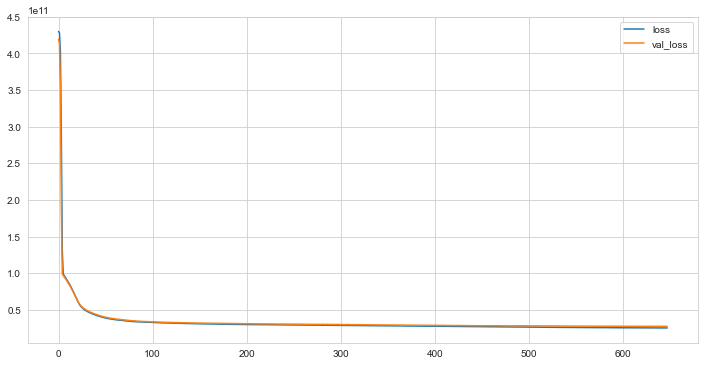

In [104]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [105]:
y_pred = model.predict(X_test)

In [106]:
eval_metric(y_test, y_pred)

r2_score: 0.7911185982680535 
mae: 102275.14655099649 
mse: 27672934180.29063 
rmse: 166351.83852392685


### learning_rate

In [76]:
from tensorflow.keras.optimizers import Adam

In [77]:
model = Sequential()

model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.1)
model.compile(optimizer = opt, loss = 'mse')

In [78]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

In [79]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 700, callbacks = [early_stop])

Epoch 1/700
119/119 [==============================] - 1s 4ms/step - loss: 116276649984.0000 - val_loss: 45521735680.0000
Epoch 2/700
119/119 [==============================] - 0s 3ms/step - loss: 42360811520.0000 - val_loss: 39283957760.0000
Epoch 3/700
119/119 [==============================] - 0s 3ms/step - loss: 37882716160.0000 - val_loss: 39373869056.0000
Epoch 4/700
119/119 [==============================] - 0s 3ms/step - loss: 37068517376.0000 - val_loss: 68747976704.0000
Epoch 5/700
119/119 [==============================] - 0s 3ms/step - loss: 40221564928.0000 - val_loss: 36447035392.0000
Epoch 6/700
119/119 [==============================] - 0s 3ms/step - loss: 34735415296.0000 - val_loss: 38308556800.0000
Epoch 7/700
119/119 [==============================] - 0s 3ms/step - loss: 33970171904.0000 - val_loss: 32946814976.0000
Epoch 8/700
119/119 [==============================] - 0s 3ms/step - loss: 33067214848.0000 - val_loss: 33158273024.0000
Epoch 9/700
119/119 [==========

Epoch 68/700
119/119 [==============================] - 0s 3ms/step - loss: 23359387648.0000 - val_loss: 22613356544.0000
Epoch 69/700
119/119 [==============================] - 0s 3ms/step - loss: 20953823232.0000 - val_loss: 22354497536.0000
Epoch 70/700
119/119 [==============================] - 0s 3ms/step - loss: 19902218240.0000 - val_loss: 28201693184.0000
Epoch 71/700
119/119 [==============================] - 0s 4ms/step - loss: 20284018688.0000 - val_loss: 24629440512.0000
Epoch 72/700
119/119 [==============================] - 0s 3ms/step - loss: 20110501888.0000 - val_loss: 22124828672.0000
Epoch 73/700
119/119 [==============================] - 0s 3ms/step - loss: 19935793152.0000 - val_loss: 21371486208.0000
Epoch 74/700
119/119 [==============================] - 0s 3ms/step - loss: 20199686144.0000 - val_loss: 25304344576.0000
Epoch 75/700
119/119 [==============================] - 0s 2ms/step - loss: 20261654528.0000 - val_loss: 26233657344.0000
Epoch 76/700
119/119 [==

Epoch 135/700
119/119 [==============================] - 0s 3ms/step - loss: 17620893696.0000 - val_loss: 22621532160.0000
Epoch 136/700
119/119 [==============================] - 0s 3ms/step - loss: 18637873152.0000 - val_loss: 28742776832.0000
Epoch 137/700
119/119 [==============================] - 0s 3ms/step - loss: 19020453888.0000 - val_loss: 20038539264.0000
Epoch 138/700
119/119 [==============================] - 0s 4ms/step - loss: 17203025920.0000 - val_loss: 23093301248.0000
Epoch 139/700
119/119 [==============================] - 0s 3ms/step - loss: 17779177472.0000 - val_loss: 22415140864.0000
Epoch 140/700
119/119 [==============================] - 0s 3ms/step - loss: 17423892480.0000 - val_loss: 26307915776.0000
Epoch 141/700
119/119 [==============================] - 1s 4ms/step - loss: 17703202816.0000 - val_loss: 21778634752.0000
Epoch 142/700
119/119 [==============================] - 0s 3ms/step - loss: 17664309248.0000 - val_loss: 22217373696.0000
Epoch 143/700
11

119/119 [==============================] - 0s 3ms/step - loss: 16118994944.0000 - val_loss: 18707443712.0000
Epoch 202/700
119/119 [==============================] - 0s 2ms/step - loss: 14786071552.0000 - val_loss: 19913703424.0000
Epoch 203/700
119/119 [==============================] - 0s 3ms/step - loss: 15737527296.0000 - val_loss: 21321928704.0000
Epoch 204/700
119/119 [==============================] - 0s 3ms/step - loss: 14817290240.0000 - val_loss: 23593416704.0000
Epoch 205/700
119/119 [==============================] - 0s 3ms/step - loss: 15746223104.0000 - val_loss: 21305890816.0000
Epoch 206/700
119/119 [==============================] - 0s 3ms/step - loss: 14970114048.0000 - val_loss: 20147406848.0000
Epoch 207/700
119/119 [==============================] - 0s 3ms/step - loss: 14807198720.0000 - val_loss: 18631526400.0000
Epoch 208/700
119/119 [==============================] - 0s 3ms/step - loss: 14808669184.0000 - val_loss: 19671248896.0000
Epoch 209/700
119/119 [=======

<AxesSubplot:>

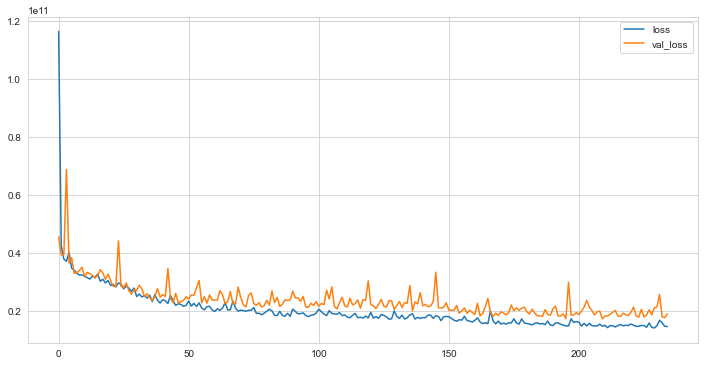

In [80]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [81]:
y_pred = model.predict(X_test)

In [82]:
eval_metric(y_test, y_pred)

r2_score: 0.8569080232221569 
mae: 77318.54813025738 
mse: 18957048460.362362 
rmse: 137684.59776010664


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

In [83]:
from tensorflow.keras.layers import Dropout

In [84]:
model = Sequential()

model.add(Dense(19, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(19, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(19, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(19, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(lr = 0.01)
model.compile(optimizer = opt, loss = 'mse')
# Dropout u genellikle eğer modelimizde overfitting varsa kullanılır. Çünkü Dropout layer larda belirlenen nöron sayılarını her seferinde Dropout da yazılan yüzdelik kadar (burada yüzde 20) kısmını kapatarak nöromların (w) ağırlık değerlerini kontrol altında tutuyor ve overfitting i engellemeye çalısıyor.  

In [85]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

In [86]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 700, callbacks = [early_stop])

Epoch 1/700
119/119 [==============================] - 2s 5ms/step - loss: 289469333504.0000 - val_loss: 93207937024.0000
Epoch 2/700
119/119 [==============================] - 0s 3ms/step - loss: 107171545088.0000 - val_loss: 76555329536.0000
Epoch 3/700
119/119 [==============================] - 1s 4ms/step - loss: 87560216576.0000 - val_loss: 62413836288.0000
Epoch 4/700
119/119 [==============================] - 1s 5ms/step - loss: 72036171776.0000 - val_loss: 50273574912.0000
Epoch 5/700
119/119 [==============================] - 0s 4ms/step - loss: 72311767040.0000 - val_loss: 53301161984.0000
Epoch 6/700
119/119 [==============================] - 0s 4ms/step - loss: 67079516160.0000 - val_loss: 47043936256.0000
Epoch 7/700
119/119 [==============================] - 1s 5ms/step - loss: 67509280768.0000 - val_loss: 43581976576.0000
Epoch 8/700
119/119 [==============================] - 1s 5ms/step - loss: 64585584640.0000 - val_loss: 40487129088.0000
Epoch 9/700
119/119 [=========

119/119 [==============================] - 1s 5ms/step - loss: 49694232576.0000 - val_loss: 33798703104.0000
Epoch 69/700
119/119 [==============================] - 1s 5ms/step - loss: 49071321088.0000 - val_loss: 32294287360.0000
Epoch 70/700
119/119 [==============================] - 1s 5ms/step - loss: 50016980992.0000 - val_loss: 30479284224.0000
Epoch 71/700
119/119 [==============================] - 1s 5ms/step - loss: 52085149696.0000 - val_loss: 30828603392.0000
Epoch 72/700
119/119 [==============================] - 1s 5ms/step - loss: 50700128256.0000 - val_loss: 35781808128.0000
Epoch 73/700
119/119 [==============================] - 1s 5ms/step - loss: 50164752384.0000 - val_loss: 29548048384.0000
Epoch 74/700
119/119 [==============================] - 1s 5ms/step - loss: 50897551360.0000 - val_loss: 29968816128.0000
Epoch 75/700
119/119 [==============================] - 1s 4ms/step - loss: 49535389696.0000 - val_loss: 30508562432.0000
Epoch 76/700
119/119 [===============

Epoch 135/700
119/119 [==============================] - 0s 4ms/step - loss: 49294749696.0000 - val_loss: 31085338624.0000
Epoch 136/700
119/119 [==============================] - 0s 3ms/step - loss: 49998204928.0000 - val_loss: 31680425984.0000
Epoch 137/700
119/119 [==============================] - 0s 3ms/step - loss: 49606995968.0000 - val_loss: 31218235392.0000
Epoch 138/700
119/119 [==============================] - 0s 4ms/step - loss: 47745380352.0000 - val_loss: 29202978816.0000
Epoch 139/700
119/119 [==============================] - 0s 4ms/step - loss: 48682442752.0000 - val_loss: 29212825600.0000
Epoch 00139: early stopping


<AxesSubplot:>

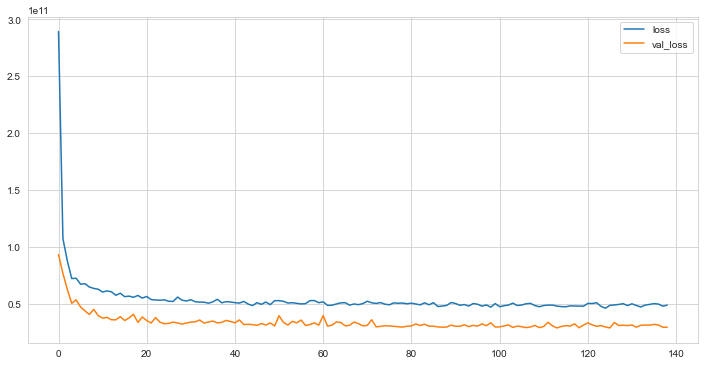

In [87]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [88]:
y_pred = model.predict(X_test)

In [89]:
eval_metric(y_test, y_pred)

r2_score: 0.7794951689165466 
mae: 105108.27998147863 
mse: 29212824245.784748 
rmse: 170917.59489819867


### Prediction

In [90]:
single_house = df.drop('price', axis = 1).iloc[0]

In [91]:
single_house = scaler.transform(single_house.values.reshape(-1, 19))
single_house

array([[0.2       , 0.06666667, 0.06150342, 0.00310751, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.47826087, 0.        , 0.57149751, 0.21760797,
        0.16193426, 0.00574235, 0.        , 0.81818182]])

In [92]:
model.predict(single_house)

array([[282764.75]], dtype=float32)

In [93]:
df.iloc[0]

price           221900.000
bedrooms             3.000
bathrooms            1.000
sqft_living       1180.000
sqft_lot          5650.000
floors               1.000
waterfront           0.000
view                 0.000
condition            3.000
grade                7.000
sqft_above        1180.000
sqft_basement        0.000
yr_built          1955.000
yr_renovated         0.000
lat                 47.511
long              -122.257
sqft_living15     1340.000
sqft_lot15        5650.000
year              2014.000
month               10.000
Name: 0, dtype: float64

### Linear Regression

In [94]:
from sklearn.linear_model import LinearRegression 

In [95]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.6852137486994498 
mae: 125706.96306733611 
mse: 41703373976.201515 
rmse: 204214.03961579507


### Random Forest

In [96]:
from sklearn.ensemble import RandomForestRegressor

In [97]:
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.8760740082656548 
mae: 69062.54581244534 
mse: 16417908842.323141 
rmse: 128132.38795216118
